# HuBMAP - Hacking the Human Vasculature 
## 📊🎯🎭Extended EDA and focus on Datasets and Annotations 
<img src="hubmap-long.jpg" alt="A sample image of test set">

## Competition and structure of this notebook
The goal of this competition is to segment instances of microvascular structures, including capillaries, arterioles, and venules. We will have to create a model trained on 2D PAS-stained histology images from healthy human kidney tissue slides. The model will be able to locate microvasculature structures (blood vessels) within human kidney histology slides.

For more detailed information check: [HuBMAP - Hacking the Human Vasculature](https://www.kaggle.com/competitions/hubmap-hacking-the-human-vasculature/overview)

<small>Note: Some of the code for the polygon annotation and display of images and masks was modified from [ezmgszi's notebook](https://www.kaggle.com/code/ezmgszi/data-import-and-binary-mask-generation). Many thanks!</small>

### Contents
- [Datasets and annotations](#Datasets-and-annotations)
    - [Decyphering datasets and WSIs](#Decyphering-datasets-and-WSIs)
    - [Training datasets](#Training-datasets)
    - [Annotations](#Annotations)
    - [Display tiles and annotations](#Display-tiles-and-annotations)
    - [Test dataset](#Test-set)


In [50]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import cv2
from scipy.ndimage import label
from scipy.ndimage import find_objects

In [51]:
plt.style.use("seaborn-v0_8")
# INPUT_PATH = '/kaggle/input/hubmap-organ-segmentation'
INPUT_PATH = '.'
train_images_path = os.path.join(INPUT_PATH, 'train')
test_images_path = os.path.join(INPUT_PATH,'test')

# Datasets and annotations
All the images provided to us are tiles taken from quite large human kidney histology slides. The tiles are of size 512x512. There are three kinds of annotations in the images: `{'blood_vessel', 'glomerulus', 'unsure'}`

Let's take a deeper look at the images and their annotations.

In [52]:
IMG_SIZE = 512
annotation_types = ['blood_vessel', 'glomerulus', 'unsure']
images = {}
masks = {}

In [53]:
def create_mask(image_id, shape, polygons):
    """
    Function to load all masks (annotations) of an image into the masks dictionary.
    It also records several statistics categorized per annotation type like:
    number of annotations, total area and sum of squared areas (used for std calculation later on)
    """
    
    masks[image_id] = {annotation_type: {'count': 0, 'area': 0, 'sum_sq_area': 0, 
                                         'image':np.zeros(shape, dtype=np.uint8)} 
                                           for annotation_type in annotation_types}
    # For each polygon
    for polygon in polygons:
        annotation_type = polygon['type']
        lines = np.array(polygon['coordinates'])
        lines = lines.reshape(-1, 1, 2)
        # Draw the polygon on the mask
        mask = masks[image_id][annotation_type]['image']
        cv2.fillPoly(mask, [lines], 1)
        
    for t in annotation_types:
        mask = masks[image_id][t]['image']
        # Calculate the areas of the mask
        labels, n_labels = label(mask)
        f = find_objects(labels)
        total_area = 0
        instances = []
        for i in range(n_labels):
            instance_area = np.sum(labels[f[i]]//(i+1))
            instances.append(instance_area)
            total_area += instance_area

        masks[image_id][t]['count'] = n_labels # number of instances per type
        masks[image_id][t]['area'] = total_area # total area of all instances
        masks[image_id][t]['sum_sq_area'] = np.sum(np.array(instances)**2) # sum of squared areas

In [54]:
import json

# Open the JSON file and read all images in RBG format + create masks
with open(os.path.join(INPUT_PATH, 'polygons.jsonl'), 'r') as file:
    for line in file:
        json_data = json.loads(line)
        image_id = json_data['id']
        # Load image
        fn = os.path.join(train_images_path, image_id + '.tif')
        assert(os.path.exists(fn))
        img = cv2.imread(fn, cv2.IMREAD_UNCHANGED)
        images[image_id] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        shape = img.shape[:2]
        assert(shape==(IMG_SIZE, IMG_SIZE))
        del img
        # Create masks
        create_mask(image_id, shape, json_data['annotations'])

All images are indeed rectangular of size 512x512 and they all open correctly. Additionally all images indicated in the `JSON` file, exist in the `train` directory.

In [55]:
annotated_images = list(images.keys())
# Inspect internal structure of masks
# masks[annotated_images[0]]

## Decyphering datasets and WSIs
Firstly, we are going to explore the meta-data of the datasets provided by the competition with `tile_meta.csv` and `wsi_meta.csv` files. 

In [56]:
df_meta = pd.read_csv(os.path.join(INPUT_PATH, 'tile_meta.csv'))
df_meta['annotated'] = False
df_meta.loc[df_meta['id'].isin(annotated_images), 'annotated'] = True
df_meta.sample(5)

,id,source_wsi,dataset,i,j,annotated
3364,7901b1cfb50a,7,3,15872,12288,False
695,183342787e53,14,3,14347,18849,False
243,07e221fcc03f,9,3,4096,25600,False
6292,e477bfef1e06,4,2,5120,22528,True
1233,2be3daebf7a8,6,3,18432,29184,False


In [57]:
df_wsi = pd.read_csv(os.path.join(INPUT_PATH, 'wsi_meta.csv'))
df_wsi

,source_wsi,age,sex,race,height,weight,bmi
0,1,58,F,W,160.0,59.0,23.0
1,2,56,F,W,175.2,139.6,45.5
2,3,73,F,W,162.3,87.5,33.2
3,4,53,M,B,166.0,73.0,26.5


Each tile belongs to a dataset and comes from a source_wsi. In the training set we have in total 4 WSI's which are annotated (1-4). The rest of WSIs are *NOT* annotated. Let's see the proportion of annotated vs. non-annotated tiles.

Total train images: 7033
Annotated train images: 1633 (23.22%)


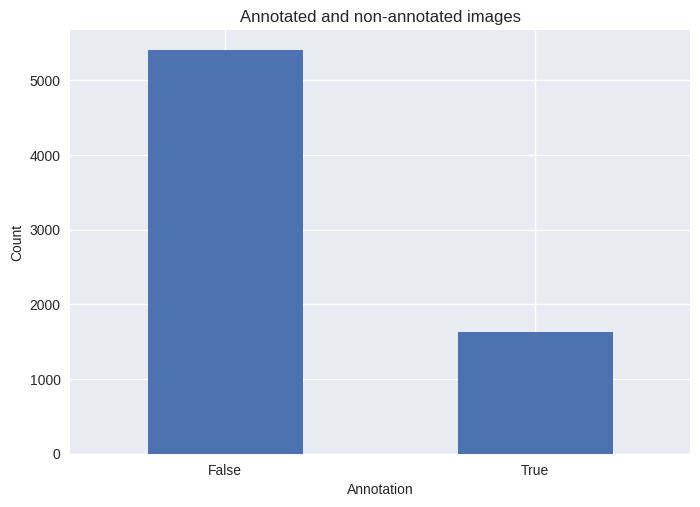

In [58]:
import glob
train_images = glob.glob(os.path.join(train_images_path, '*.tif'))
print(f'Total train images: {len(train_images)}')
print(f'Annotated train images: {len(annotated_images)} ({(len(annotated_images)/len(train_images) * 100):.2f}%)')
dt_ann = df_meta['annotated'].value_counts()
ax = dt_ann.plot(kind='bar', title='Annotated and non-annotated images', xlabel='Annotation', ylabel='Count')
# Adjust the rotation angle of the x-axis labels
ax.set_xticklabels(dt_ann.index, rotation=0)
plt.show()

### More detailed information on datasets
The competition gives us the following information about the datasets:

>The competition data comprises tiles extracted from five Whole Slide Images (WSI) split into two datasets. Tiles from Dataset 1 have annotations that have been expert reviewed. Dataset 2 comprises the remaining tiles from these same WSIs and contain sparse annotations that have not been expert reviewed.

>- All of the test set tiles are from Dataset 1.
>- Two of the WSIs make up the training set, two WSIs make up the public test set, and one WSI makes up the private test set.
>- The training data includes Dataset 2 tiles from the public test WSI, but not from the private test WSI.

>We also include, as Dataset 3, tiles extracted from an additional nine WSIs. These tiles have not been annotated. You may wish to apply semi- or self-supervised learning techniques on this data to support your predictions.

The actual test sets are hidden. Some tiles of the **public** test set's WSIs are included in the training dataset. The final **private** test set contains about 650 tiles which all come from an unknown WSI (probably `WSI-5`).

We are also informed that:
> This leaderboard is calculated with approximately 28% of the test data. The final results will be based on the other 72%.

Let's see some statistics on the training datasets.

## Training datasets

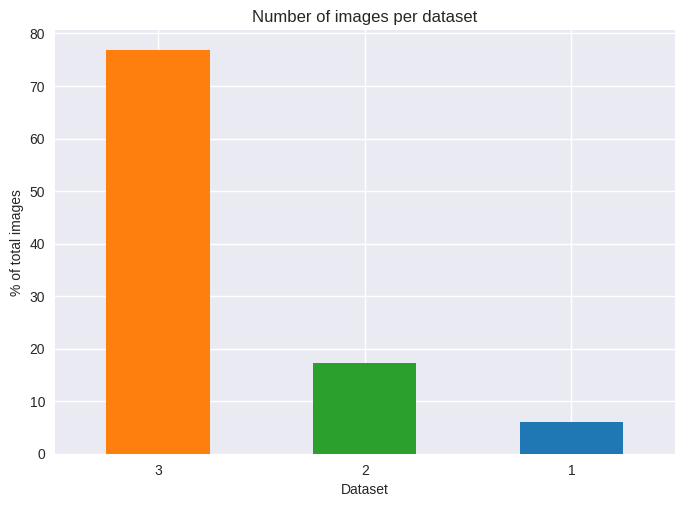

In [59]:
dt_prc = df_meta['dataset'].value_counts(normalize=True) * 100
color_palette = ['tab:orange', 'tab:green', 'tab:blue']
ax = dt_prc.plot(kind='bar', title='Number of images per dataset', 
                xlabel='Dataset', ylabel='% of total images', color=color_palette)
ax.set_xticklabels(dt_prc.index, rotation=0)
plt.show()

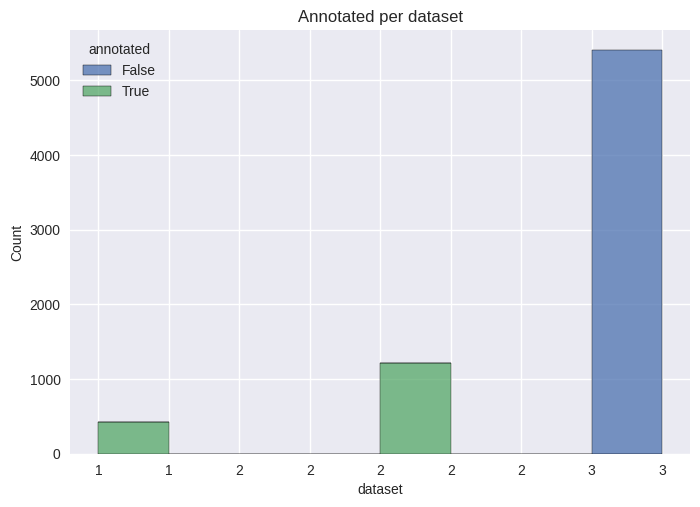

In [60]:
sns.histplot(x='dataset', hue='annotated', multiple="stack", 
             data=df_meta, binwidth=0.25).set_title("Annotated per dataset")
formatter = ticker.StrMethodFormatter('{x:,.0f}')
plt.gca().xaxis.set_major_formatter(formatter)
plt.show()

In [61]:
ds3 = pd.Series(df_meta[['dataset', 'source_wsi']].value_counts()[3], name='tiles')
print(f"\nDataset 3 WSI sources. Total number of tiles: {ds3.sum()}.")
pd.DataFrame(ds3).T


Dataset 3 WSI sources. Total number of tiles: 5400.


source_wsi,6,7,8,9,10,11,12,13,14
tiles,600,600,600,600,600,600,600,600,600


**Dataset 3** contains only non-annotated images and the source of tiles are from slides `WSI 6` to `WSI 14`. We have no extra meta-data on these WSIs' other than that each WSI is comprised of 600 tiles. We will not do any further analysis on this dataset as it can be used for Semi Supervised or Unsupervised Learning techniques.

The same applies for `WSI 5`, which is missing from our datasets completely and it is most probably the WSI used in the *private* testset. 

### Datasets for supervised learning
The training dataset for supervised learning is comprised of 1663 annotated images belonging to either **Dataset&nbsp;1** or **Dataset&nbsp;2**. Dataset 1 contains images from `WSI 1` and `WSI 2`. Dataset 2 contains images from `WSI 1` - `WSI 4`.

In [62]:
sds12 = pd.Series(df_meta[['dataset', 'source_wsi']].value_counts().sort_index(), name='tiles')
dds12 = pd.DataFrame(sds12).loc[pd.IndexSlice['1':'2', :]]
print(f"Dataset 1 has in total {dds12.xs(1, level=0)['tiles'].sum()} expert reviewed and annotated tiles.")
print(f"Dataset 2 has in total {dds12.xs(2, level=0)['tiles'].sum()} sparsely annotated tiles.")
dds12

Dataset 1 has in total 422 expert reviewed and annotated tiles.
Dataset 2 has in total 1211 sparsely annotated tiles.


tiles
dataset source_wsi       
1       1             270
        2             152
2       1             237
        2             293
        3             410
        4             271

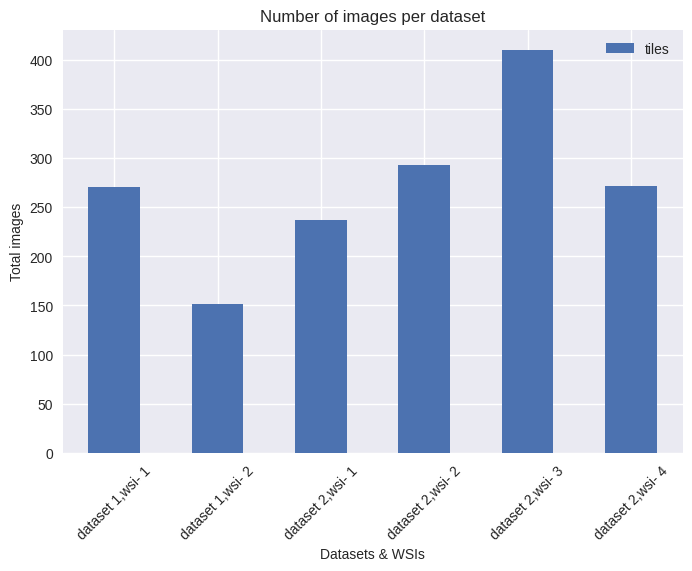

In [63]:
dds12.plot(kind='bar', title='Number of images per dataset', 
            xlabel='Datasets & WSIs', ylabel='Total images')
current_labels = [item.get_text() for item in plt.xticks()[1]]
# Replacing the x-axis labels (ds,wsi) format to readable text
for i, label in enumerate(current_labels):
    ds, wsi = label.replace('(', '').replace(')', '').split(',')
    current_labels[i] = f"dataset {ds},wsi-{wsi}"
plt.gca().set_xticklabels(current_labels, rotation=45)
plt.show()

Let's now have an overview of the positions of the tiles at each WSI.

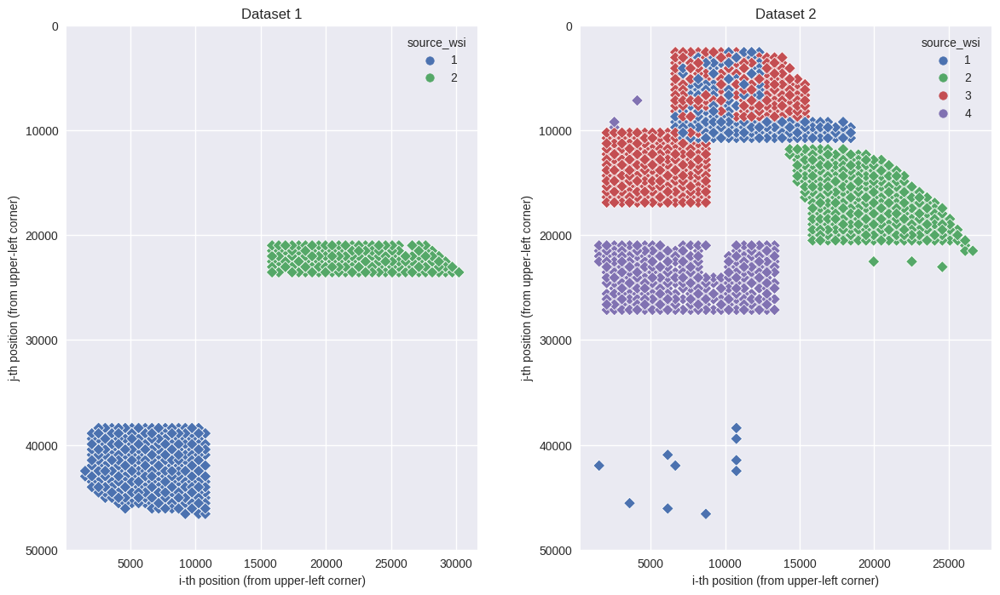

In [64]:
plt.figure(figsize=(14, 8))
for i in range(1,3):
    plt.subplot(1,2,i)
    sns.scatterplot(x='i', y='j', hue='source_wsi', palette=sns.color_palette()[:i*2], marker='D',
                    data=df_meta[df_meta.dataset==i]).set_title(f'Dataset {i}')
    plt.xlabel('i-th position (from upper-left corner)')
    plt.ylabel('j-th position (from upper-left corner)')
    plt.ylim(50000, 0)

plt.subplots_adjust(wspace=0.25)
plt.show()

Finally the table below shows an overview of the WSIs with their repective features of the individuals they were taken from, with the added distribution of the WSIs in the two datasets.

In [65]:
df_wsi['dataset1'] = df_wsi['source_wsi'].map(dds12.xs(1, level=0)['tiles']).fillna(0).astype(int)
df_wsi['dataset2'] = df_wsi['source_wsi'].map(dds12.xs(2, level=0)['tiles']).fillna(0).astype(int)
df_wsi

,source_wsi,age,sex,race,height,weight,bmi,dataset1,dataset2
0,1,58,F,W,160.0,59.0,23.0,270,237
1,2,56,F,W,175.2,139.6,45.5,152,293
2,3,73,F,W,162.3,87.5,33.2,0,410
3,4,53,M,B,166.0,73.0,26.5,0,271


## Annotations
We accumulate all statistics of every annotation type *per tile image* to a DataFrame.

Then we plot graphs for every annotation type category on:
- Number of annotations
- Total area size of annotations
- Mean area size of annotation

In [66]:
image_area = IMG_SIZE**2

# Create a dataframe with all the masks statistics per type
df = pd.DataFrame.from_dict({(i,j): masks[i][j] 
                               for i in masks.keys() 
                                   for j in masks[i].keys()}, orient='index')
del df['image']
df['mean_area'] = np.where(df['count'] == 0, 0, df['area'] / df['count'])
df['percent_image'] = df['area'] / image_area * 100.0
df.index.names = ['image_id', 'annotation_type']
df[["count", "area","mean_area", "percent_image"]].head(6)

count   area  mean_area  percent_image
image_id     annotation_type                                        
0006ff2aa7cd blood_vessel         8  10766    1345.75       4.106903
             glomerulus           1  56426   56426.00      21.524811
             unsure               0      0       0.00       0.000000
00168d1b7522 blood_vessel         1   1651    1651.00       0.629807
             glomerulus           1  20754   20754.00       7.917023
             unsure               0      0       0.00       0.000000

In [67]:
def plot_counts(df, n_bins, title, x_label):
    """
    Plot annotation counts excluding zeros 
    
    """
    colors = [('steelblue', 'lightblue'),('mediumpurple', 'plum'),('gray', 'lightgray')]
    plt.figure(figsize=(8,15))
    # fig.suptitle(title)
    for i, t in enumerate(annotation_types):
        plt.subplot(3,1, i+1)
        df_at = df.iloc[:,i]
        zeros = len(df_at[df_at == 0])
        plt.hist(df_at[df_at != 0], bins=n_bins[i], color=colors[i][0], ec=colors[i][1])
        plt.title(t)
        plt.xlabel(x_label)
        plt.ylabel('Number of images')
        formatter = ticker.StrMethodFormatter('{x:,.0f}')
        plt.gca().xaxis.set_major_formatter(formatter)
        # Display the proportion of images having zero annotations
        title_text = plt.gca().title
        x, y = title_text.get_position()
        plt.text(x,y-.02, f'[Number of images having no "{t}" annotations: {zeros} ({zeros/len(df_at)*100:.1f}%)]', 
                 transform=plt.gca().transAxes, ha='center', va='center', fontsize=9)
    plt.subplots_adjust(hspace=0.3)

### Number of annotations per tile image

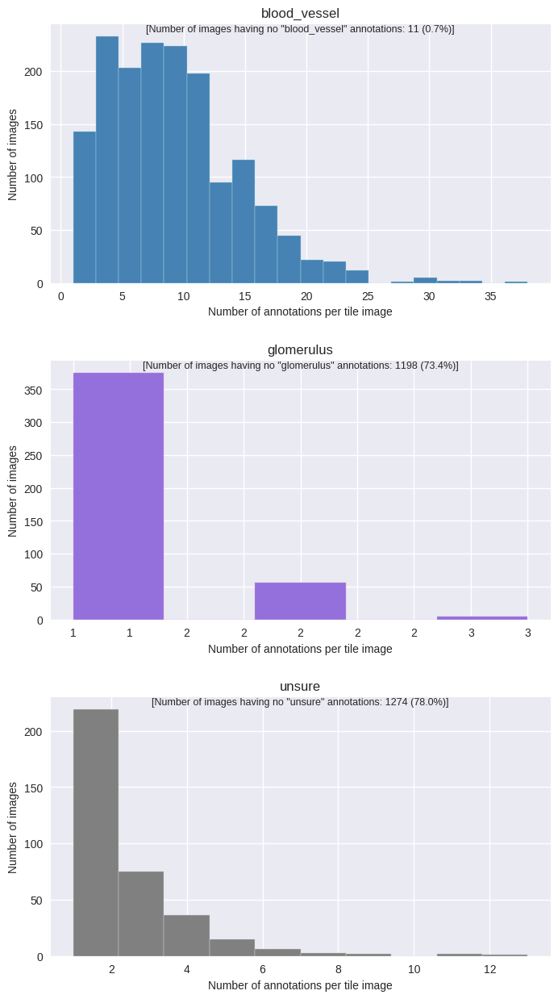

In [68]:
df_count = df.unstack(level=-1)['count']
n_bins = [20, 5, 10]
plot_counts(df_count, n_bins, "Counts", 'Number of annotations per tile image')

### Total area size of annotations per tile image

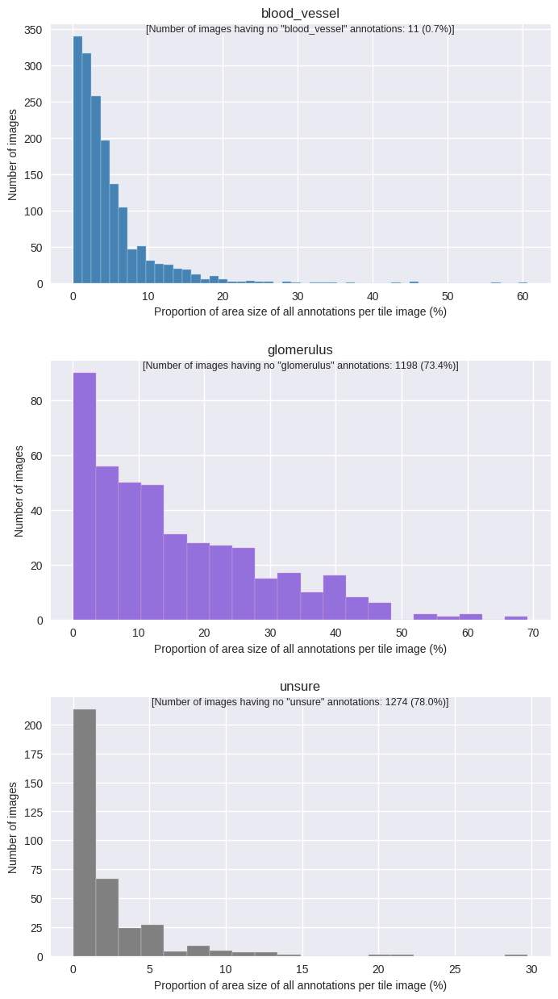

In [69]:
df_area = df.unstack(level=-1)['percent_image']
n_bins = [50, 20, 20]
plot_counts(df_area, n_bins, "Area", 'Proportion of area size of all annotations per tile image (%)')

### Mean area of annotations per tile image

The total area of every image is 262,144 pixels


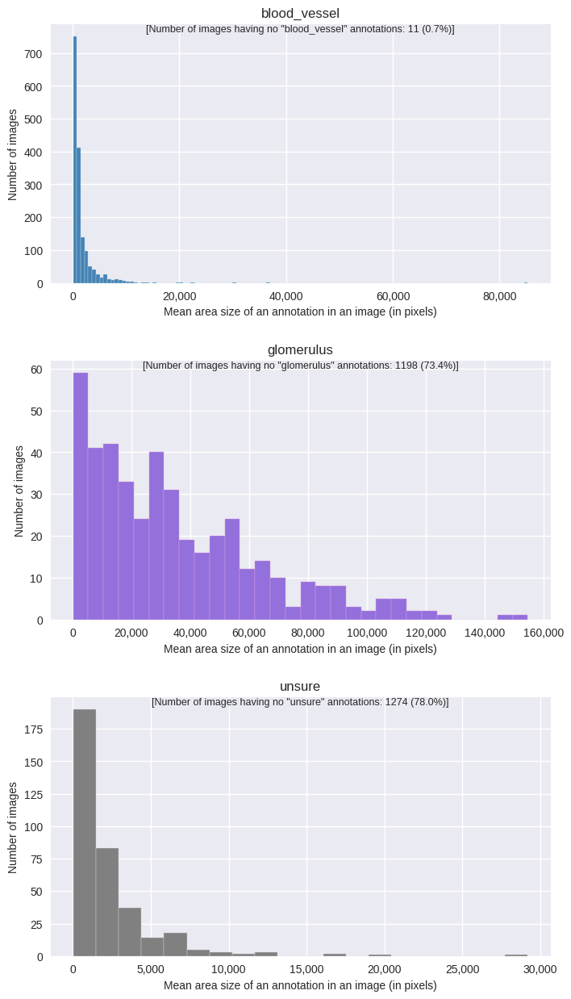

In [70]:
print(f"The total area of every image is {image_area:,} pixels")
df_mean_area = df.unstack(level=-1)['mean_area']
n_bins = [120, 30, 20]
plot_counts(df_mean_area, n_bins, "Mean Area Size", 'Mean area size of an annotation in an image (in pixels)')

The main bulk of blood vessels have a mean size between 0-10K pixels, so let's zoom in to have a more clear picture on that.

Number of images with a mean blood vessel area size < 10K pixels: 1613 (98.78%)


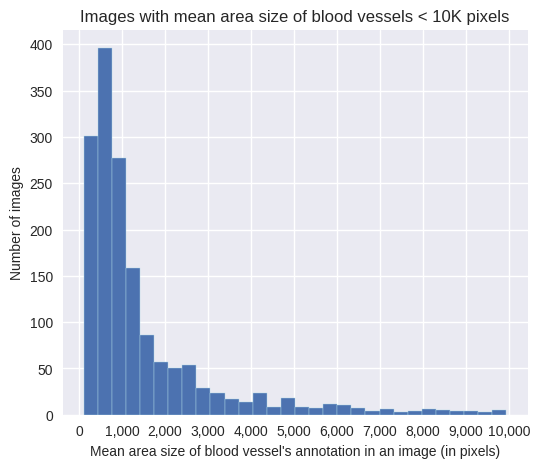

In [71]:
mean_cnd = df_mean_area.iloc[:,0].values
nr_mcnd = (mean_cnd<10000).sum()
print(f'Number of images with a mean blood vessel area size < 10K pixels: {nr_mcnd} ({nr_mcnd/len(mean_cnd)*100:.2f}%)')
mean_data = mean_cnd[(mean_cnd > 0) & (mean_cnd<10000)] 
plt.figure(figsize=(6,5))
plt.hist(mean_data, bins=30, ec='lightblue')
plt.title('Images with mean area size of blood vessels < 10K pixels')
plt.xlabel("Mean area size of blood vessel's annotation in an image (in pixels)")
plt.ylabel('Number of images')
plt.xticks(np.arange(0, 11000, 1000))
formatter = ticker.StrMethodFormatter('{x:,.0f}')
plt.gca().xaxis.set_major_formatter(formatter)

### Conclusions
- A lot of tiles (~73-78%) do not have either a `glomerulus` or an `unsure` annotation
- The `glomerulus` annotations are usually one per tile with a relatively large mean area size
- Most tiles that have an `unsure` annotation, they have 1-4 annotations with a mean  area size a little larger than the `blood_vessel`
- There are very few (<0.1%) tiles with no `blood_vessel`s
- Most tiles have between 1-16 `blood_vessel`s
- The `blood_vessel`s are quite small as their mean area size is mostly less than 3,000 pixels (an equivalent of ~55x55 pixels square area). Almost 99% of all the `blood_vessel`s have a mean area size less than 10,000 pixels (an equivalent of 100x100 pixels square area)
- The total area of all `blood_vessel`s in a tile, is mostly less than 10% of area of the tile

### Statistics of Dataset 1 vs Dataset 2
We calculate the mean and standard deviation per dataset for the following:
- Number of annotations per tile
- Area size of annotation per tile

These statistics will give us a rough idea of the distribution of the annotations in the two datasets. We have to keep in mind that **dataset 1** has expert annotated and reviewed tiles, while **dataset 2** have sparsely annotated tiles thar are not expert reviewed, so that might cause some ambiguity in the models' precision if dataset 2 is included in the training.

Furthermore, these statistics could be used for a pure statistically random constructed submission to the competition to get a bare minimum baseline.

In [72]:
ext_df = df.unstack(level=-1)
ext_df.head(3)[["count", "area","mean_area", "percent_image"]]

count                           area                    \
annotation_type blood_vessel glomerulus unsure blood_vessel glomerulus unsure   
image_id                                                                        
0006ff2aa7cd               8          1      0        10766      56426      0   
00168d1b7522               1          1      0         1651      20754      0   
0033bbc76b6b               3          0      1         3088          0   2742   

                   mean_area                    percent_image             \
annotation_type blood_vessel glomerulus  unsure  blood_vessel glomerulus   
image_id                                                                   
0006ff2aa7cd     1345.750000    56426.0     0.0      4.106903  21.524811   
00168d1b7522     1651.000000    20754.0     0.0      0.629807   7.917023   
0033bbc76b6b     1029.333333        0.0  2742.0      1.177979   0.000000   

                          
annotation_type   unsure  
image_id                  
0006ff2aa7cd     0.00000  
00168d1b7522     0.00000  
0033bbc76b6b     1.04599

In [73]:
ext_df1 = ext_df.loc[df_meta[df_meta.dataset==1].id]
ext_df2 = ext_df.loc[df_meta[df_meta.dataset==2].id]

print(f"Tiles in dataset 1: {len(ext_df1)} and in dataset 2: {len(ext_df2)}") 

Tiles in dataset 1: 422 and in dataset 2: 1211


#### Number of annotations per tile

In [74]:
# Average number of instances of annotations
print('Dataset 1 mean number of annotations')
mean_cnt_df1 = ext_df1['count'].mean() 
print(mean_cnt_df1)
print('\nDataset 2 mean number of annotations')
mean_cnt_df2 = ext_df2['count'].mean() 
print(mean_cnt_df2)

Dataset 1 mean number of annotations
annotation_type
blood_vessel    7.578199
glomerulus      0.085308
unsure          2.002370
dtype: float64

Dataset 2 mean number of annotations
annotation_type
blood_vessel    9.536746
glomerulus      0.382329
unsure          0.019818
dtype: float64


In [75]:
# Standard deviation of number of instances of annotations
print('Dataset 1 standard deviation of number of annotations')
std_cnt_df1 = ext_df1['count'].std() 
print(std_cnt_df1)
print('\nDataset 2 standard deviation of number of annotations')
std_cnt_df2 = ext_df2['count'].std() 
print(std_cnt_df2)

Dataset 1 standard deviation of number of annotations
annotation_type
blood_vessel    6.361053
glomerulus      0.296171
unsure          1.751143
dtype: float64

Dataset 2 standard deviation of number of annotations
annotation_type
blood_vessel    4.963263
glomerulus      0.587741
unsure          0.265860
dtype: float64


#### Area size of annotation 

In [76]:
# Average area size per annotation type
print('Dataset 1 mean area size of annotation in pixels')
mean_area_df1 = ext_df1['area'].sum()/ext_df1['count'].sum()
print(mean_area_df1)
print('\nDataset 2 mean area size of annotation in pixels')
mean_area_df2 = ext_df2['area'].sum()/ext_df2['count'].sum()
print(mean_area_df2)

Dataset 1 mean area size of annotation in pixels
annotation_type
blood_vessel     2349.618512
glomerulus      42822.138889
unsure           2371.931361
dtype: float64

Dataset 2 mean area size of annotation in pixels
annotation_type
blood_vessel     1051.917395
glomerulus      34592.950324
unsure           4330.208333
dtype: float64


In [77]:
# Standard deviation of area size per annotation type
print('Dataset 1 standard deviation of area size of annotation in pixels')
std_area_df1 = np.sqrt(ext_df1['sum_sq_area'].sum()/ext_df1['count'].sum() - mean_area_df1**2)
print(std_area_df1)
std_area_df2 = np.sqrt(ext_df2['sum_sq_area'].sum()/ext_df2['count'].sum() - mean_area_df2**2)
print('\nDataset 2 standard deviation of area size of annotation in pixels')
print(std_area_df2)

Dataset 1 standard deviation of area size of annotation in pixels
annotation_type
blood_vessel     4451.945398
glomerulus      37356.245666
unsure           4187.966199
dtype: float64

Dataset 2 standard deviation of area size of annotation in pixels
annotation_type
blood_vessel     3467.289469
glomerulus      30710.321015
unsure           8719.744506
dtype: float64


#### Graphical representation of the statistics

In [78]:
df_cnt = pd.DataFrame()
df_cnt['Mean count ds-1'] = mean_cnt_df1
df_cnt['Std count ds-1'] = std_cnt_df1
df_cnt['Mean area ds-1'] = mean_area_df1
df_cnt['Std area ds-1'] = std_area_df1

df_cnt['Mean count ds-2'] = mean_cnt_df2
df_cnt['Std count ds-2'] = std_cnt_df2
df_cnt['Mean area ds-2'] = mean_area_df2
df_cnt['Std area ds-2'] = std_area_df2

df_cnt

,Mean count ds-1,Std count ds-1,Mean area ds-1,Std area ds-1,Mean count ds-2,Std count ds-2,Mean area ds-2,Std area ds-2
annotation_type,,,,,,,,
blood_vessel,7.578199,6.361053,2349.618512,4451.945398,9.536746,4.963263,1051.917395,3467.289469
glomerulus,0.085308,0.296171,42822.138889,37356.245666,0.382329,0.587741,34592.950324,30710.321015
unsure,2.002370,1.751143,2371.931361,4187.966199,0.019818,0.265860,4330.208333,8719.744506


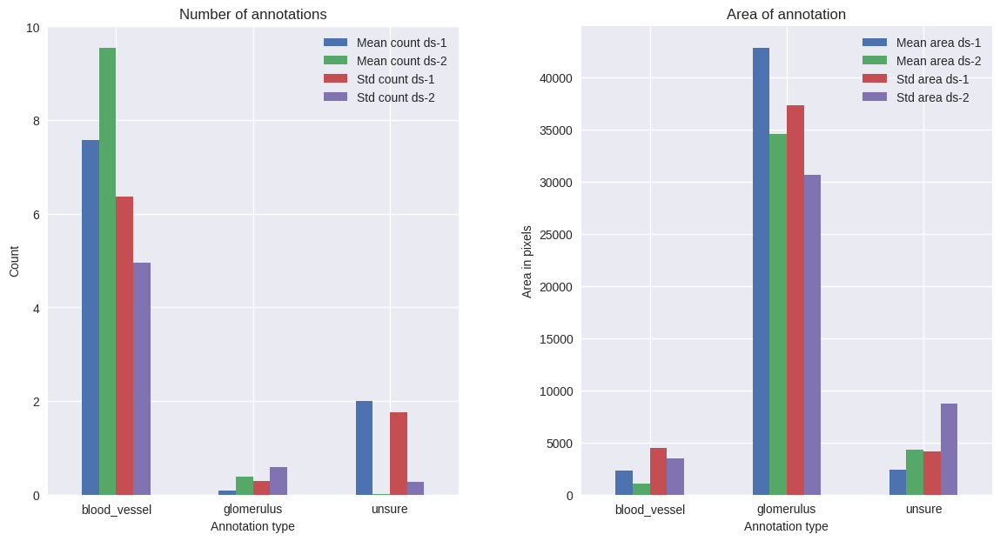

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(14, 7))

df_cnt[['Mean count ds-1','Mean count ds-2','Std count ds-1','Std count ds-2']].plot.bar(ax=axs[0])
axs[0].set_title('Number of annotations')
axs[0].set_ylabel('Count')

df_cnt[['Mean area ds-1','Mean area ds-2','Std area ds-1','Std area ds-2']].plot.bar(ax=axs[1])
axs[1].set_title('Area of annotation')
axs[1].set_ylabel('Area in pixels')

plt.subplots_adjust(wspace=0.3)
for ax in axs:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    ax.set_xlabel('Annotation type')
plt.show()

## Display tiles and annotations
Some sample tiles and their respective annotations are displayed for dataset 1 and datatset2

In [80]:
import matplotlib.patches as mpatches

def display_image_and_masks(image_id):
    """
    Given an image_id as input, the image is displayed in RGB, 
    the mask of all annotations with different shades of gray 
    and a final image with its overlayed mask
    """
    if image_id not in images.keys():
        return
    
    image = images[image_id]
    mask = masks[image_id]
    combined_mask = np.zeros(image.shape[:2])
    overlay = image.copy()
    # Colors for blood vessels, glomerulus and unsure respectively
    colors = [(255, 0, 0), (0, 0, 255), (0, 206, 209)]  
    colorsRBG = [tuple(c / 255 for c in tup) for tup in colors] 
    
    # Initialize dictionary to hold annotation counts
    annotation_counts = {}
    for i, a_t in enumerate(mask.keys()):
        annotation_counts[a_t] = mask[a_t]['count']
        # update overlay
        overlay[mask[a_t]['image'] > 0] = colors[i]
        combined_mask += mask[a_t]['image'] * (i+1)
        
    # print annotation counts
    print(f"Annotation counts for image {image_id}: {annotation_counts}")

    # prepare for subplot
    plt.figure(figsize=(25,25))

    # plot the original image
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title('Image' + f" {image_id}")
    plt.axis('off')
    # plot the mask
    plt.subplot(1,3,2)
    plt.imshow(combined_mask, cmap='bone')
    plt.title('All annotations mask')
    plt.axis('off')
    # plot the overlay
    plt.subplot(1,3,3)
    plt.imshow(image)  # Use RGB image
    plt.imshow(overlay, alpha=0.4)  # change alpha to adjust transparency

    # Create a list of Patch objects representing the colors
    patches = [mpatches.Patch(color=color, label=label) 
               for color, label in zip(colorsRBG, list(annotation_counts.keys()))]
    legend = plt.legend(handles=patches)
    
    plt.title('Overlay')
    plt.axis('off')
    plt.show()


### Dataset 1

Annotation counts for image 097dd2ed6c14: {'blood_vessel': 6, 'glomerulus': 1, 'unsure': 0}


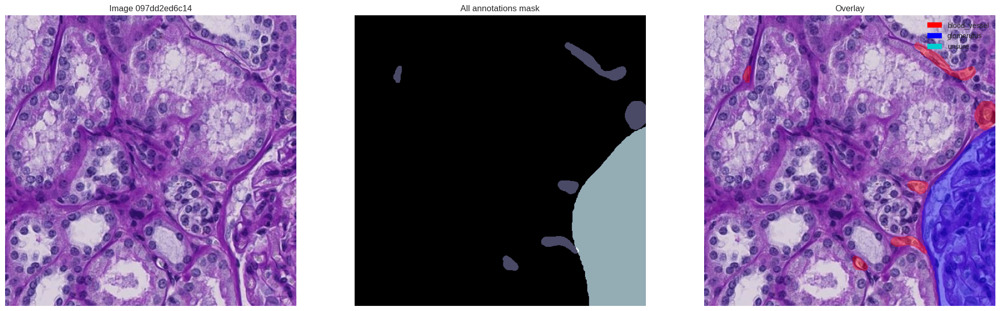

Annotation counts for image 0754412b2917: {'blood_vessel': 13, 'glomerulus': 1, 'unsure': 3}


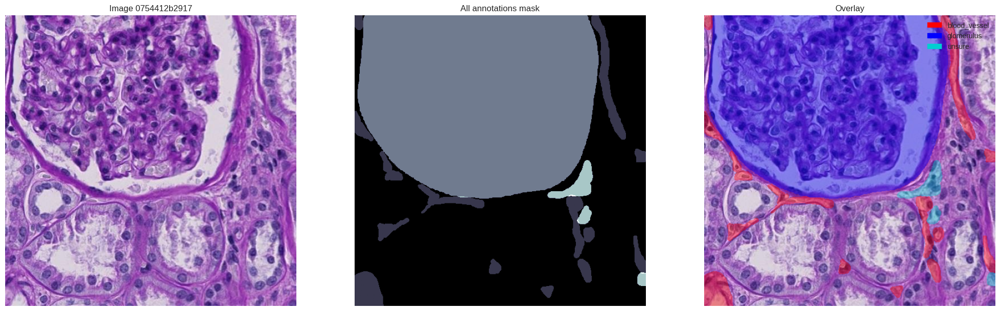

Annotation counts for image 00656c6f2690: {'blood_vessel': 9, 'glomerulus': 0, 'unsure': 1}


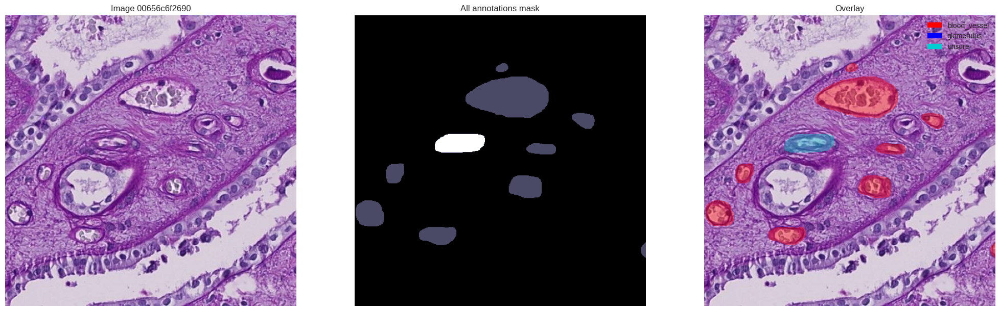

Annotation counts for image 06b972c417e7: {'blood_vessel': 23, 'glomerulus': 0, 'unsure': 1}


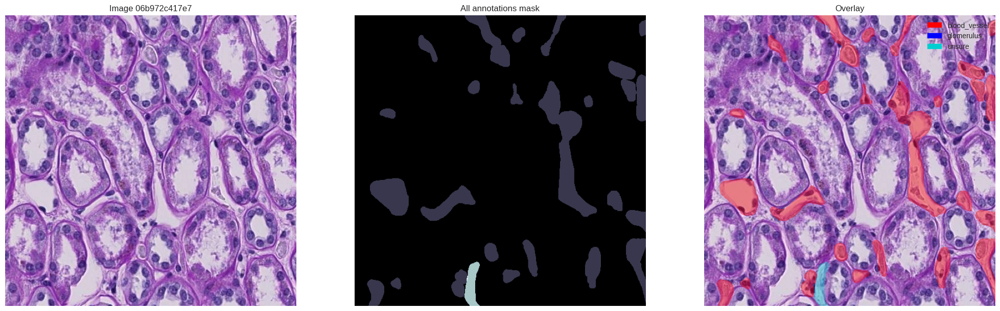

In [81]:
image_ids = ['097dd2ed6c14', '0754412b2917', '00656c6f2690', '06b972c417e7']
for im_id in image_ids: 
    display_image_and_masks(im_id)

### Dataset 2

Annotation counts for image 00da8fdf2391: {'blood_vessel': 12, 'glomerulus': 2, 'unsure': 0}


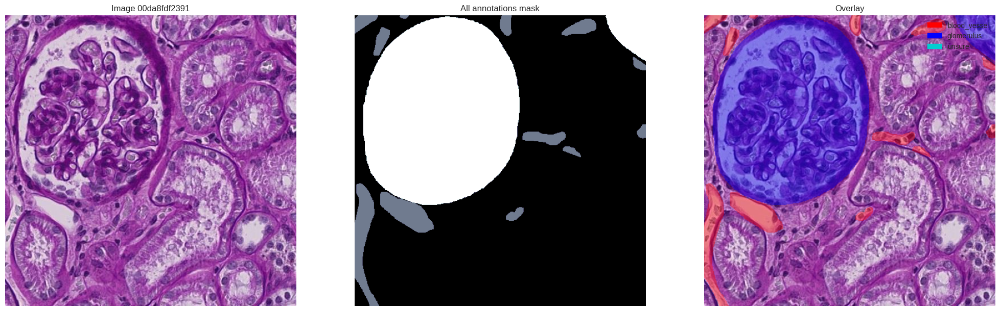

Annotation counts for image 014b60dfe193: {'blood_vessel': 13, 'glomerulus': 1, 'unsure': 0}


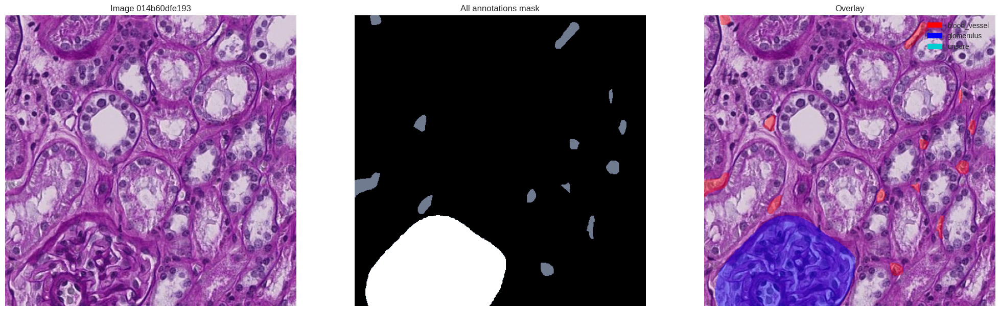

Annotation counts for image fa207406c405: {'blood_vessel': 10, 'glomerulus': 1, 'unsure': 6}


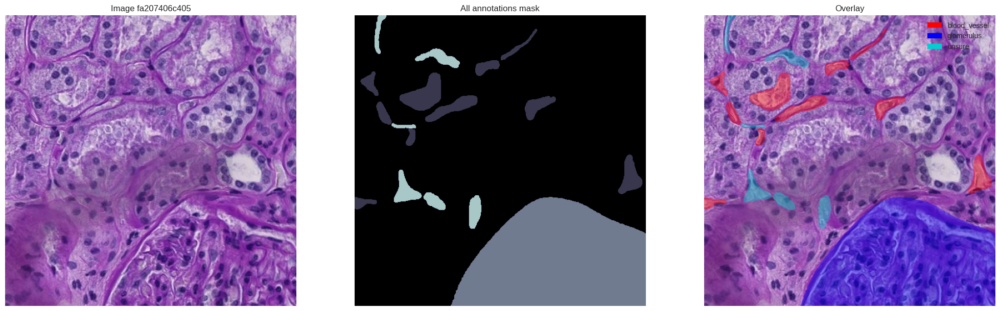

Annotation counts for image 5e568e50245f: {'blood_vessel': 7, 'glomerulus': 0, 'unsure': 3}


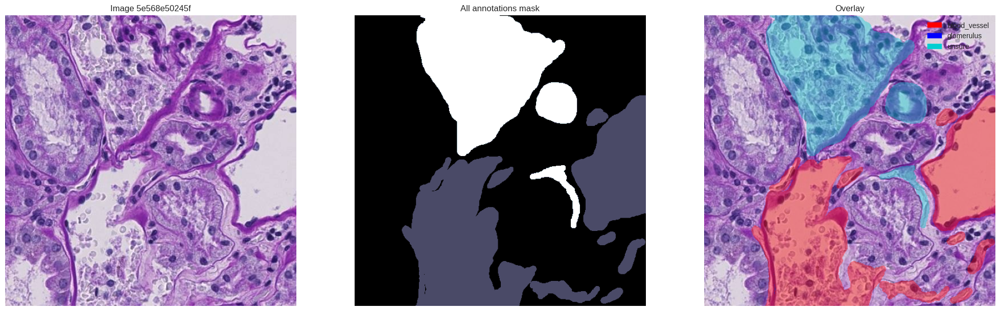

In [82]:
image_ids = ['00da8fdf2391', '014b60dfe193', 'fa207406c405', '5e568e50245f']
for im_id in image_ids:
    display_image_and_masks(im_id)

## Test dataset
The test data set is comprised by only one image. This will be replaced during submission, by ~28% of the test set for scoring the results in the leaderboard. After the competition closes, it will be replaced by ~72% of the test set and this will define the final scoring in the leaderboard. There are about 650 tiles in the full test set.

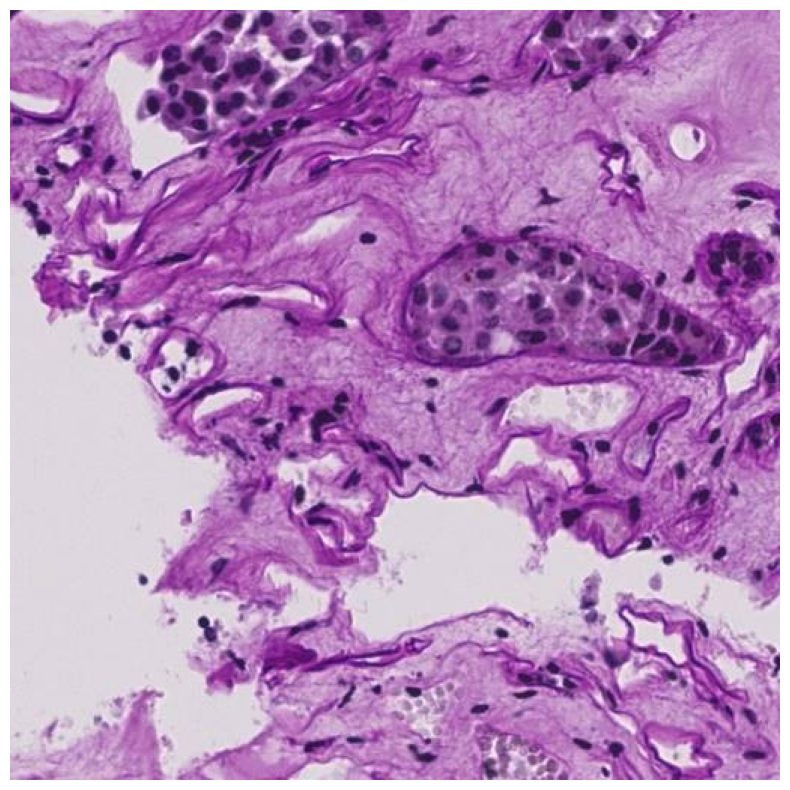

In [83]:
plt.figure(figsize=(10, 10))
fn = os.path.join(test_images_path, '72e40acccadf.tif')
img = cv2.imread(fn, cv2.IMREAD_UNCHANGED)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off');